<a href="https://colab.research.google.com/github/IlyaZutler/Project-3-Berlin-Airbnb-Ratings/blob/main/4%20Exploratory%20Data%20Analysis%203.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

!pip install openpyxl -q
import openpyxl
import pickle

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Word from the Comments
from wordcloud import WordCloud

# for map
!pip install -q folium matplotlib
import folium
from matplotlib.colors import LinearSegmentedColormap, Normalize, to_hex

# Set display options
%matplotlib inline
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_colwidth', 1000)

In [ ]:
Comments = pd.read_excel('https://raw.githubusercontent.com/IlyaZutler/Project-3-Berlin-Airbnb-Ratings/main/Comments.xlsx', engine='openpyxl')

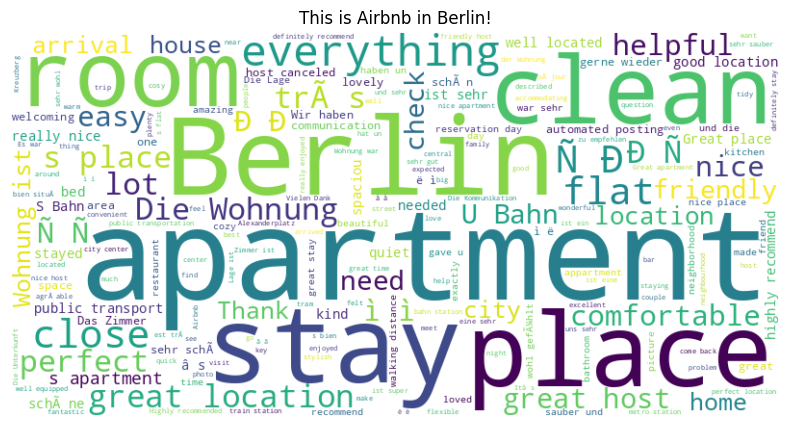

In [ ]:
# from wordcloud import WordCloud

text_comm = ' '.join(Comments['Comments'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_comm)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("This is Airbnb in Berlin!")
plt.show()

In [ ]:
# import pickle

!wget https://github.com/IlyaZutler/Project-3-Berlin-Airbnb-Ratings/raw/main/apartments4.pkl -q

with open('apartments4.pkl', 'rb') as f:
    apartments = pickle.load(f)

In [ ]:
# apartments = pd.read_excel('https://raw.githubusercontent.com/IlyaZutler/Project-3-Berlin-Airbnb-Ratings/main/apartments_4.xlsx', engine='openpyxl')

## Price on the Map

In [ ]:
# import pandas as pd
# import folium
# import matplotlib.pyplot as plt
# from matplotlib.colors import LinearSegmentedColormap, Normalize, to_hex

df = apartments[['Latitude', 'Longitude','Price']]
df.dropna(inplace=True)

colors = ['blue', 'red', 'yellow']
cmap = LinearSegmentedColormap.from_list('RatingColorMap', colors, N=10)

# normalisation
#norm = Normalize(vmin=df['Price'].min(), vmax=df['Price'].max())
norm = Normalize(vmin=15, vmax=80)

# make map
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12)

# add points to the map
for idx, row in df.iterrows():
    color = to_hex(cmap(norm(row['Price'])))
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius = 2, #row['Reviews Log'] + 1,
        color=color,
        fill=True,
        fill_color=color
    ).add_to(m)

legend_html = '''
<div style="
    position: fixed;
    bottom: 50px; left: 50px; width: 150px; height: 100px;
    background-color: white; z-index:9999; font-size:14px;
    border:2px solid grey; border-radius:5px;
    ">
    <div style="padding: 10px;">
        <b>Price</b><br>
        <i style="background:blue; width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>15<br>
        <i style="background:linear-gradient(blue, red, yellow); width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>...<br>
        <i style="background:yellow; width:18px; height:18px; float:left; margin-right:5px; border-radius:50%;"></i>80<br>
    </div>
</div>
'''

# add legend to the map
m.get_root().html.add_child(folium.Element(legend_html))

# save the map
m.save('map_price.html')

m

4 Exploratory Data Analysis 3.ipynb